In [ ]:
!pip install -q git+https://github.com/tensorflow/examples.git

In [1]:
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf
print(tf.__version__)

2.1.0-dev20191106


In [2]:
from __future__ import absolute_import, division, print_function, unicode_literals

import tensorflow_datasets as tfds
from tensorflow_examples.models.pix2pix import pix2pix

import os
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output

tfds.disable_progress_bar()
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [3]:
import pandas as pd

df3 = pd.read_csv('../.data/nexet/train.csv', delimiter=',')
df3.dataframeName = 'train.csv'
nRow, nCol = df3.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 50000 rows and 3 columns


In [4]:
df3.head(5)

,image_filename,lighting,city
0,frame_20f328fa-2459-46d0-97a5-5ae2d6103cb0_000...,Twilight,NYC
1,frame_927bde20-f97f-48c2-af30-f9127b6b32ce_000...,Day,NYC
2,frame_67012509-f3bd-4175-a9d2-565a7b6bb3c7_000...,Day,NYC
3,frame_bd043377-6fb8-407a-95e5-7deb1fbab13a_000...,Day,NYC
4,frame_4da1583b-58d0-4893-8149-54541191031d_000...,Day,NYC


In [5]:
df3 = df3.loc[df3['lighting'].isin(('Day', 'Night'))]
df3.head()

,image_filename,lighting,city
1,frame_927bde20-f97f-48c2-af30-f9127b6b32ce_000...,Day,NYC
2,frame_67012509-f3bd-4175-a9d2-565a7b6bb3c7_000...,Day,NYC
3,frame_bd043377-6fb8-407a-95e5-7deb1fbab13a_000...,Day,NYC
4,frame_4da1583b-58d0-4893-8149-54541191031d_000...,Day,NYC
5,frame_0726993f-b5d9-458f-8abb-08cd48633e23_000...,Night,NYC


In [7]:
BUFFER_SIZE = 1000
BATCH_SIZE = 4
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [8]:
import numpy as np 

CLASS_NAMES = np.array(['Day', 'Night'])

day = df3.loc[df3['lighting'] == 'Day']
night = df3.loc[df3['lighting'] == 'Night']

msk = np.random.rand(len(day)) < 0.8
_train_day = day[msk]
_test_day = day[~msk]

msk = np.random.rand(len(night)) < 0.8
_train_night = night[msk]
_test_night = night[~msk]

In [9]:
def random_crop(image):
  cropped_image = tf.image.random_crop(
      image, size=[IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image

def normalize(image):
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1
  return image

def random_jitter(image):
  # resizing to 286 x 286 x 3
  image = tf.image.resize(image, [286, 286],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  # randomly cropping to 256 x 256 x 3
  image = random_crop(image)

  # random mirroring
  image = tf.image.random_flip_left_right(image)

  return image

def preprocess_image_train(image):
    #print(image)
    image = random_jitter(image)
    image = normalize(image)
    return image

def preprocess_image_test(image):
  image = normalize(image)
  return image

In [10]:
train_image_generator = tf.keras.preprocessing.image.ImageDataGenerator(
                                                                        preprocessing_function=preprocess_image_train)
test_image_generator = tf.keras.preprocessing.image.ImageDataGenerator(
                                                                       preprocessing_function=preprocess_image_test)

In [11]:
_train_day_generator = train_image_generator.flow_from_dataframe(
    dataframe=_train_day,
    directory=str('/data/road-scanner/networks/.data/nexet/nexet/nexet_2017_1/'),
    x_col="image_filename",
    y_col="lighting",
    batch_size=BATCH_SIZE,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    classes = list(CLASS_NAMES))

_train_night_generator = train_image_generator.flow_from_dataframe(
    dataframe=_train_night,
    directory=str('/data/road-scanner/networks/.data/nexet/nexet/nexet_2017_1/'),
    x_col="image_filename",
    y_col="lighting",
    batch_size=BATCH_SIZE,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    classes = list(CLASS_NAMES))

_test_day_generator = test_image_generator.flow_from_dataframe(
    dataframe=_test_day,
    directory=str('/data/road-scanner/networks/.data/nexet/nexet/nexet_2017_1/'),
    x_col="image_filename",
    y_col="lighting",
    batch_size=BATCH_SIZE,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    classes = list(CLASS_NAMES))

_test_night_generator = test_image_generator.flow_from_dataframe(
    dataframe=_test_night,
    directory=str('/data/road-scanner/networks/.data/nexet/nexet/nexet_2017_1/'),
    x_col="image_filename",
    y_col="lighting",
    batch_size=BATCH_SIZE,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    classes = list(CLASS_NAMES))


Found 20034 validated image filenames belonging to 2 classes.
Found 18480 validated image filenames belonging to 2 classes.
Found 4869 validated image filenames belonging to 2 classes.
Found 4742 validated image filenames belonging to 2 classes.


/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/dataframe_iterator.py:273: UserWarning: Found 1 invalid image filename(s) in x_col="image_filename". These filename(s) will be ignored.
  .format(n_invalid, x_col)


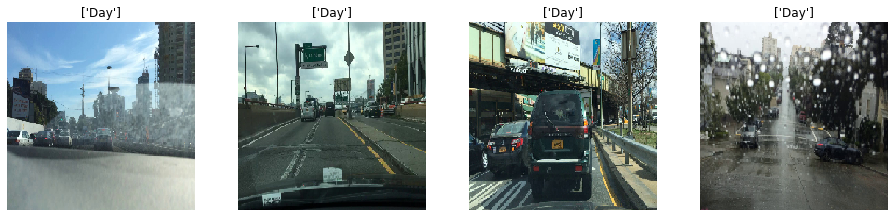

In [12]:
def show_batch(image_batch, label_batch):
  plt.figure(figsize=(20,20))
  for n in range(min(25, BATCH_SIZE)):
      label = CLASS_NAMES[label_batch[n]==1]
      ax = plt.subplot(5,5,n+1)
      plt.imshow(image_batch[n])
        
      plt.title(label)
      plt.axis('off')

image_batch, label_batch = next(_train_day_generator)

show_batch(image_batch*0.5+0.5, label_batch)

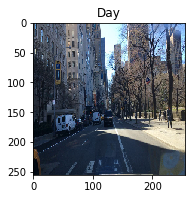

In [13]:
sample_day = next(iter(_test_day_generator))[0]
sample_night = next(iter(_test_night_generator))[0]

plt.subplot(121)
plt.title('Day')
plt.imshow(sample_day[0] * 0.5 + 0.5)

In [14]:
OUTPUT_CHANNELS = 3

generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


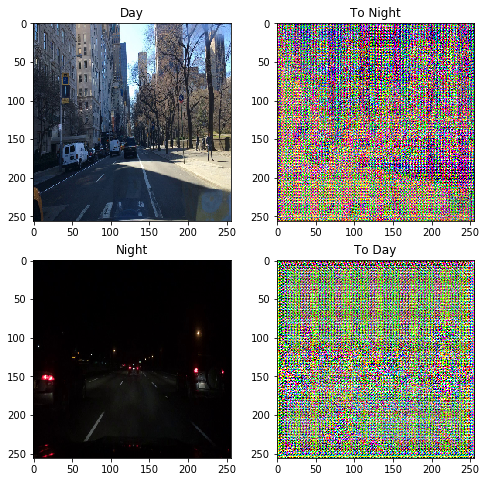

In [15]:
to_night = generator_g(sample_day)
to_day = generator_f(sample_night)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_day, to_night, sample_night, to_day]
title = ['Day', 'To Night', 'Night', 'To Day']

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

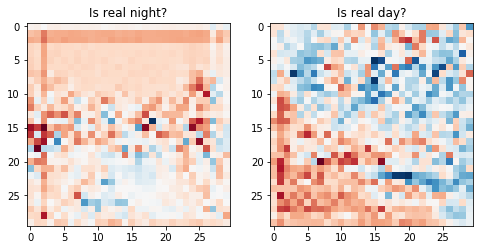

In [16]:
plt.figure(figsize=(8, 8))

plt.subplot(121)
plt.title('Is real night?')
plt.imshow(discriminator_y(sample_night)[0, ..., -1], cmap='RdBu_r')

plt.subplot(122)
plt.title('Is real day?')
plt.imshow(discriminator_x(sample_day)[0, ..., -1], cmap='RdBu_r')

plt.show()

In [17]:
LAMBDA = 10

In [18]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [19]:
def discriminator_loss(real, generated):
  real_loss = loss_obj(tf.ones_like(real), real)

  generated_loss = loss_obj(tf.zeros_like(generated), generated)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

In [20]:
def generator_loss(generated):
  return loss_obj(tf.ones_like(generated), generated)

In [21]:
def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
  
  return LAMBDA * loss1

In [22]:
def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * 0.5 * loss

In [23]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [24]:
checkpoint_path = "./checkpoints/train/day2night"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

Latest checkpoint restored!!


In [25]:
EPOCHS = 40


In [26]:
def generate_images(model, test_input, index = None):
  prediction = model(test_input)
    
  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']
  if index:
        title = [f'Input Image {index}', f'Predicted Image {index}']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [27]:
@tf.function
def train_step(real_x, real_y):
  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
  with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y
    # Generator F translates Y -> X.
    
    fake_y = generator_g(real_x, training=True)
    cycled_x = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_y = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    # calculate the loss
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)
    
    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
    
    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
  
  # Calculate the gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss, 
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss, 
                                        generator_f.trainable_variables)
  
  discriminator_x_gradients = tape.gradient(disc_x_loss, 
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss, 
                                            discriminator_y.trainable_variables)
  
  # Apply the gradients to the optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients, 
                                            generator_g.trainable_variables))

  generator_f_optimizer.apply_gradients(zip(generator_f_gradients, 
                                            generator_f.trainable_variables))
  
  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))
  
  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))

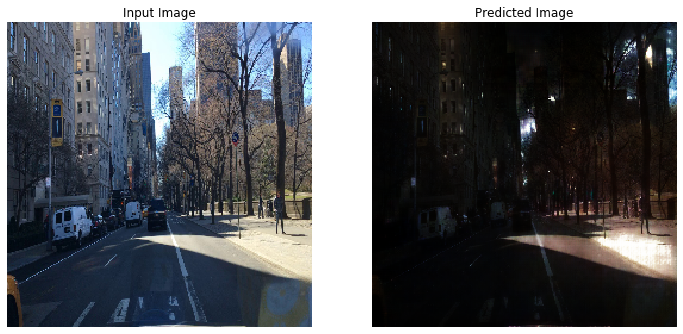

KeyboardInterrupt: 

In [35]:
for epoch in range(EPOCHS):
  start = time.time()
  
  days = _train_day_generator
  nights = _train_night_generator

  
  n = 0
  for image_x, image_y in zip(_train_day_generator, _train_night_generator):
    #image_x = np.expand_dims(image_x, axis=0)
    #image_y = np.expand_dims(image_y, axis=0)
    train_step(image_x[0], image_y[0])
    if n % 10 == 0:
      print (n)
      clear_output(wait=True)
      generate_images(generator_g, sample_day)
      print(f'{_train_day_generator.batch_index} {_train_night_generator.batch_index}')
    
    n+=1

  clear_output(wait=True)
  # Using a consistent image (sample_horse) so that the progress of the model
  # is clearly visible.
  generate_images(generator_g, sample_day)

  if True#(epoch + 1) % 5 == 0:
    ckpt_save_path = ckpt_manager.save()
    print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                         ckpt_save_path))

  print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                      time.time()-start))

In [49]:
ckpt.restore(tf.train.latest_checkpoint(checkpoint_path))

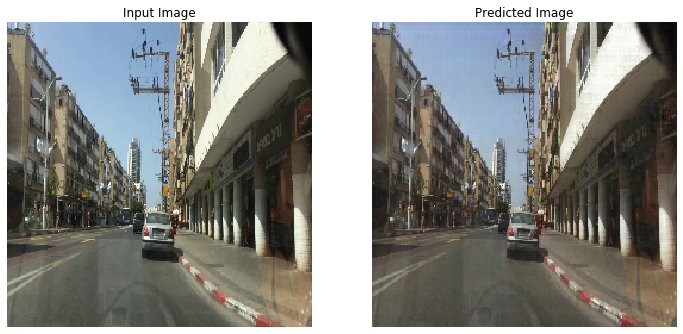

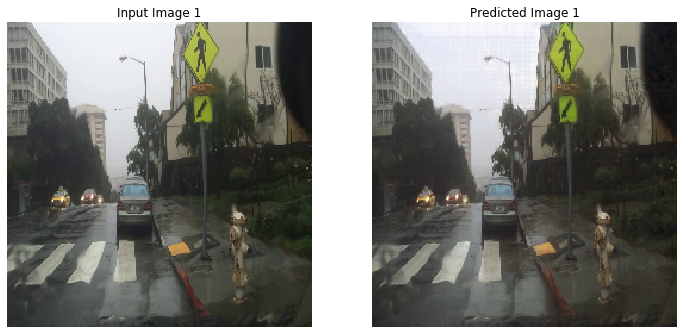

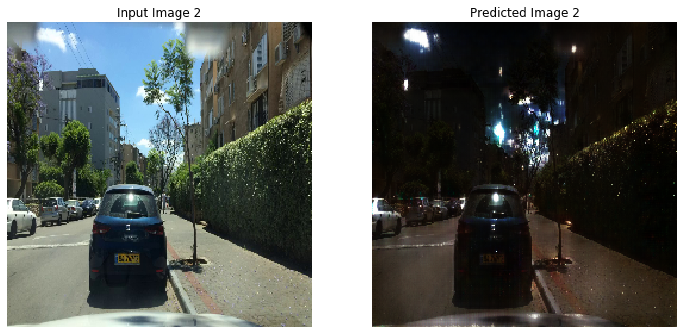

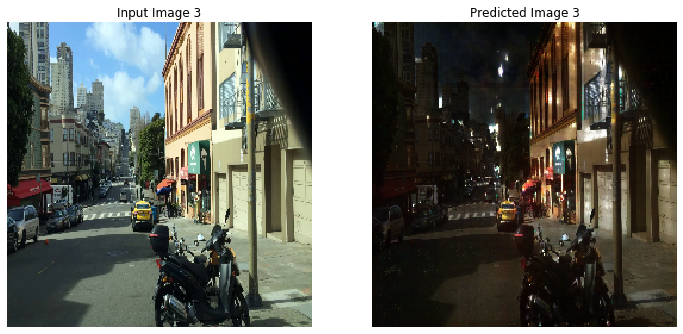

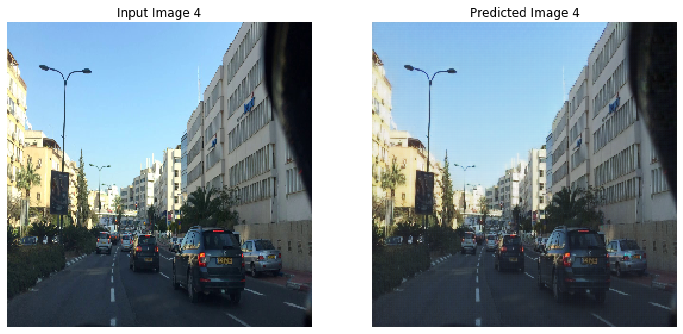

...

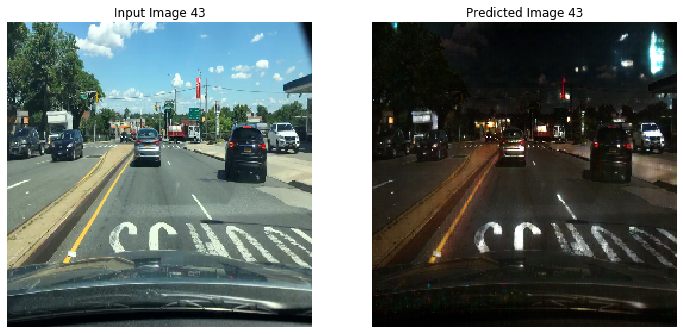

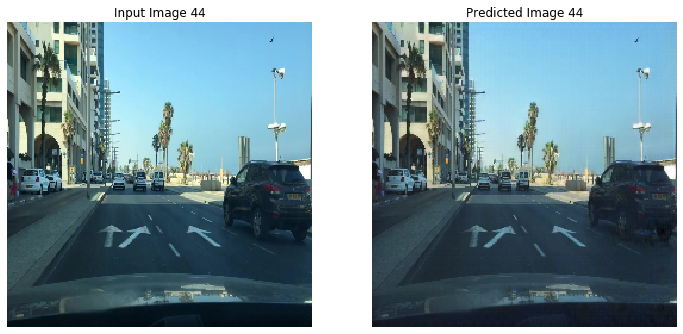

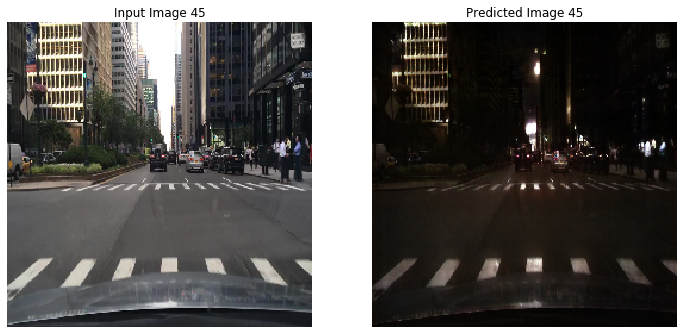

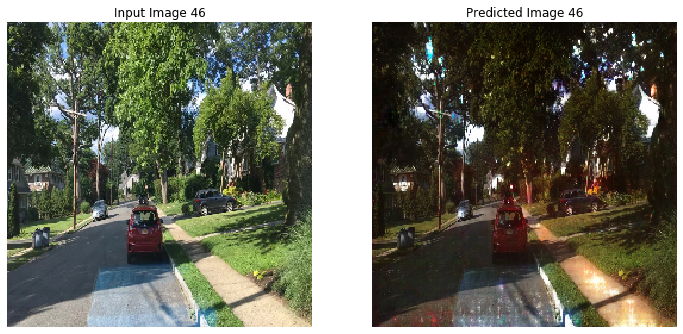

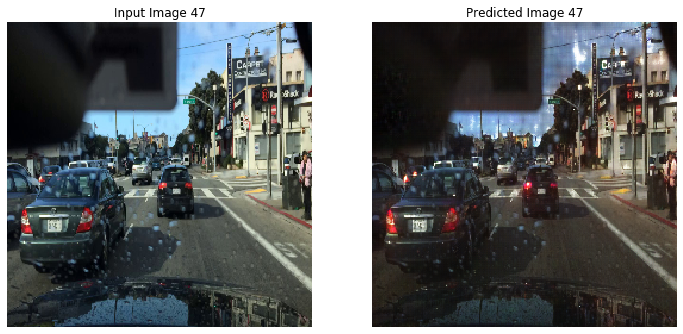

KeyboardInterrupt: 

In [43]:
# Run the trained model on the test dataset
for index, inp in enumerate(_test_day_generator):
         generate_images(generator_g,  inp[0], index)

In [109]:
days = (_train_day_generator)
nights = (_train_night_generator)


n = 0
for image_x, image_y in zip(_train_day_generator, _train_night_generator):
    n+=1
    print(image_x[0].shape)


(32, 256, 256, 3)
(32, 256, 256, 3)
(32, 256, 256, 3)


KeyboardInterrupt: 